In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
from os.path import join
import torch
import matplotlib.pyplot as plt
sys.path.append("/n/netscratch/konkle_lab/Everyone/Jingxuan/DiffusionObjectRelation/PixArt-alpha")
from diffusion.utils.misc import read_config, set_random_seed, \
    init_random_seed, DebugUnderflowOverflow
sys.path.append("/n/netscratch/konkle_lab/Everyone/Jingxuan/DiffusionObjectRelation")
from utils.pixart_sampling_utils import visualize_prompts, PixArtAlphaPipeline_custom, \
    load_embed_and_mask#, visualize_prompts_with_traj
from utils.pixart_utils import construct_diffuser_pipeline_from_config, construct_pixart_transformer_from_config, state_dict_convert
from utils.attention_map_store_utils import replace_attn_processor, AttnProcessor2_0_Store, PixArtAttentionVisualizer_Store
import psutil
import time
import os
import numpy as np

/n/home03/fjxdaisy/.conda/envs/torch2/lib/python3.10/site-packages/transformers/utils/hub.py:127: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(
/n/home03/fjxdaisy/.conda/envs/torch2/lib/python3.10/site-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(


### Load models and tokenizer

In [3]:
savedir = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/objrel_rndembdposemb_DiT_B_pilot"
ckptdir = join(savedir, "checkpoints")
config = read_config(join(savedir, 'config.py'))
#weight_dtype = torch.float32
config.mixed_precision = "bf16"
if config.mixed_precision == "fp16": # accelerator.
    weight_dtype = torch.float16
elif config.mixed_precision == "bf16": # accelerator.
    weight_dtype = torch.bfloat16
# fp16 will have overflow problem
# bf16 and float32 are good. 

### Load pretrained model

In [4]:
# Load the pretrained PixArt Alpha model from Hugging Face
model_name = "PixArt-alpha/PixArt-XL-2-512x512"
pipeline = PixArtAlphaPipeline_custom.from_pretrained(model_name,torch_dtype = weight_dtype)
pipeline = pipeline.to("cuda")
tokenizer = pipeline.tokenizer

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

Some weights of the model checkpoint were not used when initializing PixArtTransformer2DModel: 
 ['caption_projection.y_embedding']


Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

### Store and visualize attention

In [6]:
# pretrained prompts
validation_prompts = ['cat is to the upper left of dog',
 'white cat is to the upper left of brown dog',
 'cat is above and to the right of dog',
 'white cat is above and to the right of white dog',
 'cat is to the left of dog',
 'cat is to the left of cat']

In [7]:

torch.cuda.empty_cache()  # Frees unused GPU memory
torch.cuda.ipc_collect()  # Collects and releases memory from shared tensors


In [ ]:


def check_available_vram(stage):
    total_vram = torch.cuda.get_device_properties(0).total_memory / 1e9  # Total VRAM in GB
    allocated_vram = torch.cuda.memory_allocated(0) / 1e9  # Currently used VRAM in GB
    reserved_vram = torch.cuda.memory_reserved(0) / 1e9  # Reserved VRAM in GB
    free_vram = total_vram - reserved_vram  # Approximate free VRAM
    ram_usage = psutil.virtual_memory().used / 1e9  # Convert to GB

    print(f"{stage} Total VRAM: {total_vram:.2f} GB")
    print(f"{stage} Allocated VRAM: {allocated_vram:.2f} GB")
    print(f"{stage} Reserved VRAM: {reserved_vram:.2f} GB")
    print(f"{stage} Approximate Free VRAM: {free_vram:.2f} GB")
    print(f"{stage} RAM Usage:  {ram_usage:.2f} GB")

#check_available_vram()


def log_memory_usage(stage):
    """Logs VRAM and RAM usage at a given stage."""
    vram_alloc = torch.cuda.memory_allocated() / 1e9  # Convert to GB
    vram_reserved = torch.cuda.memory_reserved() / 1e9  # Convert to GB
    ram_usage = psutil.virtual_memory().used / 1e9  # Convert to GB
    
    print(f"[{stage}] VRAM Allocated: {vram_alloc:.2f} GB, VRAM Reserved: {vram_reserved:.2f} GB, RAM Usage: {ram_usage:.2f} GB")

@torch.inference_mode()
def visualize_prompts_with_traj(pipeline, validation_prompts, num_inference_steps=14, guidance_scale=4.5, 
                                num_images_per_prompt=1, device=torch.device("cuda"), random_seed=0, weight_dtype=torch.bfloat16):

    # Move pipeline to GPU (or multi-GPU)
    pipeline.to(device)
    pipeline.set_progress_bar_config(disable=True)

    # Set up generator
    if random_seed is None:
        generator = None
    else:
        generator = torch.Generator(device=device).manual_seed(random_seed)
    #image_logs = []
    #print(generator.device.type)
    image_logs, images, latents, pred_traj, latents_traj, t_traj, visualized_prompts = [], [], [], [], [], [], []

    for prompt in validation_prompts:
        # Run pipeline
        output = pipeline(
            prompt=prompt,
            num_inference_steps=num_inference_steps,
            num_images_per_prompt=num_images_per_prompt,
            generator=generator,
            guidance_scale=guidance_scale,
            use_resolution_binning=False,
            return_sample_pred_traj=True,
            output_type="latent",
            device=device,
        )
        # Store latents and trajectories
        latents.append(output[0].images)
        pred_traj.append(output[1])
        latents_traj.append(output[2])
        t_traj.append(output[3])
        visualized_prompts.append(prompt)

    for latent in latents:
        images.append(pipeline.vae.decode(latent.to(weight_dtype) / pipeline.vae.config.scaling_factor, return_dict=False)[0])

    # Postprocess images (small VRAM impact)
    for prompt, image in zip(visualized_prompts, images):
        image = pipeline.image_processor.postprocess(image, output_type="pil")
        image_logs.append({"validation_prompt": prompt, "images": image})
    print("Function execution complete!")
    return image_logs, latents_traj, pred_traj, t_traj

def visualize_prompts_with_traj_profiling(*args, **kwargs):
    """Wrapper around the function to measure VRAM & RAM usage."""
    
    print("\n Starting function execution...")
    check_available_vram("Start")

    start_time = time.time()
    
    # Run function and measure memory at different points
    image_logs, latents_traj, pred_traj, t_traj = visualize_prompts_with_traj(*args, **kwargs)
    
    torch.cuda.synchronize()  # Ensure all GPU operations are done
    check_available_vram("After Function Execution")

    end_time = time.time()
    print(f"Total Execution Time: {end_time - start_time:.2f} sec")

    # Cleanup
    torch.cuda.empty_cache()
    torch.cuda.ipc_collect()
    check_available_vram("After Memory Cleanup")
    
    return image_logs, latents_traj, pred_traj, t_traj


def report_tensor_stats(tensor, name=""):
    """Report statistics about NaN values in a tensor.
    
    Args:
        tensor (torch.Tensor): Input tensor to analyze
        name (str): Optional name to include in output
    """
    total_num = tensor.numel()
    nan_num = torch.sum(torch.isnan(tensor)).item()
    non_nan_num = total_num - nan_num
    print(f"{name + ' | ' if name else ''}| Shape: {tensor.shape} | Non-NaN values: {non_nan_num} | NaN values: {nan_num} ")


In [12]:
pipeline.transformer = replace_attn_processor(pipeline.transformer)
attnvis_store = PixArtAttentionVisualizer_Store(pipeline)
attnvis_store.setup_hooks()

Setting up hooks for PixArt attention modules:
- Block 0
- Block 1
- Block 2
- Block 3
- Block 4
- Block 5
- Block 6
- Block 7
- Block 8
- Block 9
- Block 10
- Block 11
- Block 12
- Block 13
- Block 14
- Block 15
- Block 16
- Block 17
- Block 18
- Block 19
- Block 20
- Block 21
- Block 22
- Block 23
- Block 24
- Block 25
- Block 26
- Block 27


In [13]:
# Clear residual memory from previous runs (without affecting loaded model)
#torch.cuda.empty_cache()
#torch.cuda.ipc_collect()
#torch.cuda.synchronize()
index = 4
attnvis_store.clear_activation()
image_logs, latents_traj, pred_traj, t_traj = visualize_prompts_with_traj(\
    pipeline, validation_prompts[index:index+1], num_inference_steps=14, guidance_scale=4.5, 
                                num_images_per_prompt=1, device=torch.device("cuda"), random_seed=1, weight_dtype=weight_dtype)
#embed_infos = load_embed_and_mask(validation_prompts[index:index+1], prompt_cache_dir, config.model_max_length, device=torch.device("cuda"))

#print(embed_infos[0]['prompt'])
prompt = validation_prompts[index]
# attention_mask_raw = embed_infos[0]['emb_mask'].cpu()
token_ids = tokenizer.encode(prompt)
word_tokens = tokenizer.convert_ids_to_tokens(token_ids)
word_tokens = [token.replace("▁", "") for token in word_tokens]

torch.Size([2, 120, 4096])
torch.Size([2, 120])
Function execution complete!


In [14]:
validation_prompts[index]

'cat is to the left of dog'

In [20]:
for timestep in range(len(latents_traj[0])):
    latents = latents_traj[0][timestep]
    report_tensor_stats(latents, f"Latents {timestep}")

Latents 0 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 1 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 2 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 3 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 4 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 5 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 6 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 7 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 8 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 9 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 10 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 11 | | Shape

In [17]:
# layer_i = 1 # note the 
for layer_i in range(24):
    timestep = -1
    self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
    cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
    report_tensor_stats(self_attn_map, f"Self-Attention Map {layer_i:02d} {timestep}")
    report_tensor_stats(cross_attn_map, f"Cross-Attention Map {layer_i:02d} {timestep}")

Self-Attention Map 00 -1 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 00 -1 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 01 -1 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 01 -1 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 02 -1 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 02 -1 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 03 -1 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 03 -1 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 04 -1 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values:

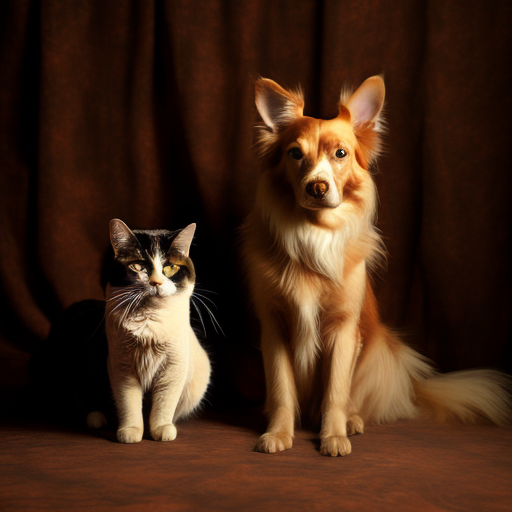

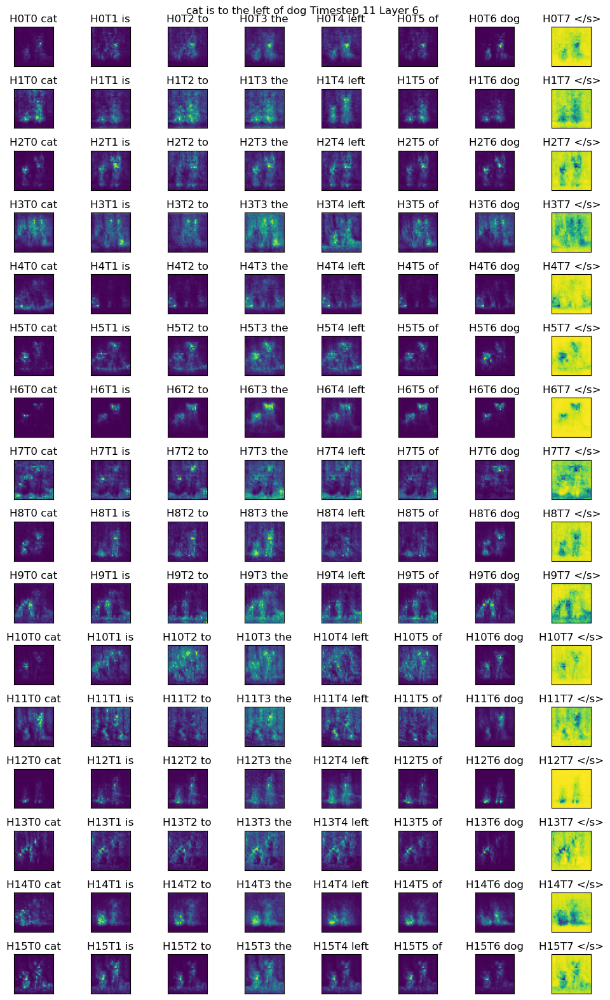

In [15]:
layer_i = 6 # note the 
timestep = 11
self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
sample_id = 0
display(image_logs[0]['images'][sample_id])
figh, axs = plt.subplots(16, len(word_tokens), figsize=(10, 16))
for head_id in range(16):
    for token_id in range(len(word_tokens)):
        ax = axs[head_id, token_id]
        ax.imshow(cross_attn_map[sample_id+1, 
                                 head_id, :, 
                                 token_id].view(32, 32).float().cpu().numpy())
        ax.axis('image')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_title(f'H{head_id}T{token_id} {word_tokens[token_id]}')
        
plt.suptitle(f'{prompt} Timestep {timestep} Layer {layer_i}')
plt.tight_layout()


In [ ]:
cross_attn_map.shape
# sample_id, head_id, token_id, token_id

torch.Size([2, 16, 1024, 120])

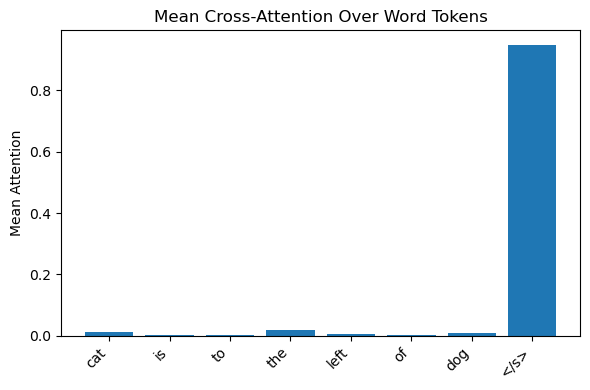

In [16]:

layer_i = 11
timestep = 11
self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]

plt.figure(figsize=(6, 4))
attn_means = cross_attn_map[1:, :, :, :].float().mean(dim=(0, 1, 2)) 
plt.bar(range(len(word_tokens)), attn_means[:len(word_tokens)])
plt.xticks(range(len(word_tokens)), word_tokens, rotation=45, ha='right')
plt.ylabel('Mean Attention')
plt.title('Mean Cross-Attention Over Word Tokens')
plt.tight_layout()
plt.show()

In [17]:
def plot_layer_across_timesteps(layer_i, attnvis_store, word_tokens, num_timesteps):
    """
    Given a particular layer, loop through all timesteps and plot as subplots.
    """
    fig, axes = plt.subplots(nrows=num_timesteps, figsize=(6, 4 * num_timesteps))
    
    for timestep in range(num_timesteps):
        cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
        attn_means = cross_attn_map[1:, :, :, :].float().mean(dim=(0, 1, 2))
        
        ax = axes[timestep] if num_timesteps > 1 else axes
        ax.bar(range(len(word_tokens)), attn_means[:len(word_tokens)])
        ax.set_xticks(range(len(word_tokens)))
        ax.set_xticklabels(word_tokens, rotation=45, ha='right')
        ax.set_ylabel('Mean Attention')
        ax.set_title(f'Mean Cross-Attention (Layer {layer_i}, Timestep {timestep})')
    
    plt.tight_layout()
    plt.show()


def plot_timestep_across_layers(timestep, attnvis_store, word_tokens, num_layers):
    """
    Given a particular timestep, loop through all layers and plot as subplots.
    """
    fig, axes = plt.subplots(nrows=num_layers, figsize=(6, 4 * num_layers))
    
    for layer_i in range(num_layers):
        cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
        attn_means = cross_attn_map[1:, :, :, :].float().mean(dim=(0, 1, 2))
        
        ax = axes[layer_i] if num_layers > 1 else axes
        ax.bar(range(len(word_tokens)), attn_means[:len(word_tokens)])
        ax.set_xticks(range(len(word_tokens)))
        ax.set_xticklabels(word_tokens, rotation=45, ha='right')
        ax.set_ylabel('Mean Attention')
        ax.set_title(f'Mean Cross-Attention (Layer {layer_i}, Timestep {timestep})')
    
    plt.tight_layout()
    plt.show()


In [ ]:
layer_i = 0
num_timesteps=14
plot_layer_across_timesteps(layer_i, attnvis_store, word_tokens, num_timesteps)

In [ ]:
timestep=7
num_layers = 28
plot_timestep_across_layers(timestep, attnvis_store, word_tokens, num_layers)

In [18]:

def plot_mean_attention_across_timesteps(token_id, num_layers, num_timesteps, attnvis_store, word_tokens, layer_range=None):
    """
    Plots mean attention across timesteps for a given token index, aggregated over layers.

    Args:
        token_id (int): The index of the token in `word_tokens` to track attention.
        num_layers (int): The total number of layers in the model.
        num_timesteps (int): The total number of timesteps.
        attnvis_store: Object storing attention activations.
        word_tokens (list): List of tokenized words.
        layer_range (list, optional): Range of layers to plot (default is all layers).
    """
    if layer_range is None:
        layer_range = range(num_layers)  # Default to all layers

    # Prepare the color spectrum for layers
    colors = plt.cm.viridis(np.linspace(0, 1, len(layer_range)))

    plt.figure(figsize=(12, 6))

    for i, layer_i in enumerate(layer_range):
        mean_attention = []

        for timestep in range(num_timesteps):
            cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
            attn_means = cross_attn_map[1, :, :, token_id].float().mean(dim=(0, 1)).cpu().numpy()  # Averaging over batch & heads
            mean_attention.append(attn_means)

        plt.plot(range(num_timesteps), mean_attention, label=f'Layer {layer_i}', color=colors[i])

    plt.xlabel("Timesteps")
    plt.ylabel("Mean Attention")
    plt.title(f"Mean Attention Over Timesteps for Token '{word_tokens[token_id]}'")
    plt.legend(title="Layer", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


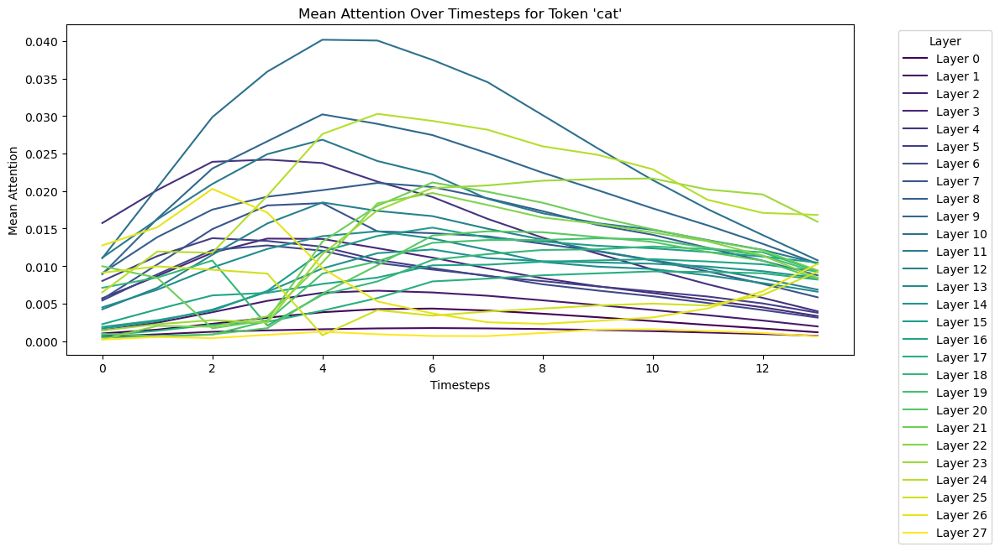

In [19]:
plot_mean_attention_across_timesteps(
    token_id=0,  # The token index within word_tokens
    num_layers=28,  # Adjust based on model architecture
    num_timesteps=14,  # Adjust based on available timesteps
    attnvis_store=attnvis_store,
    word_tokens=word_tokens
)


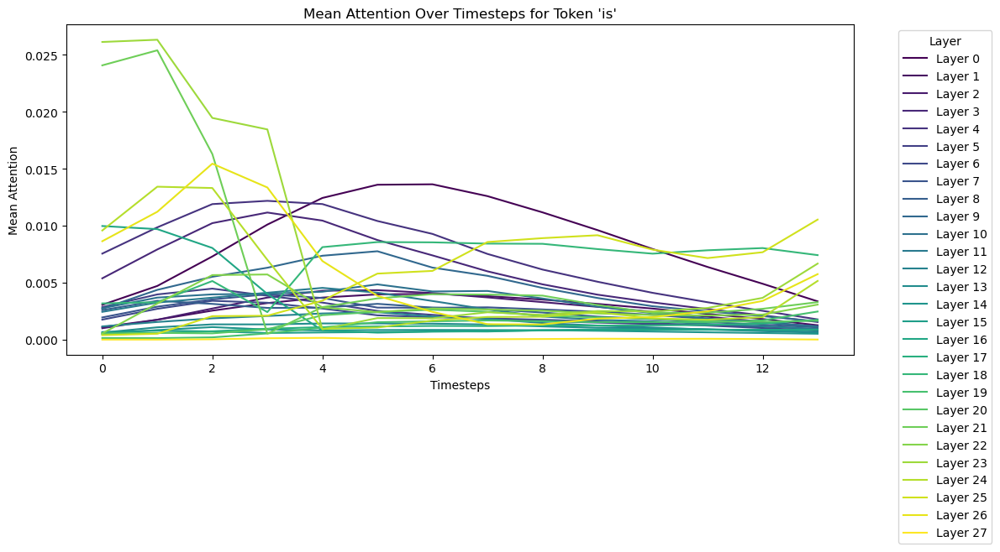

In [20]:
plot_mean_attention_across_timesteps(
    token_id=1,  # The token index within word_tokens
    num_layers=28,  # Adjust based on model architecture
    num_timesteps=14,  # Adjust based on available timesteps
    attnvis_store=attnvis_store,
    word_tokens=word_tokens
)


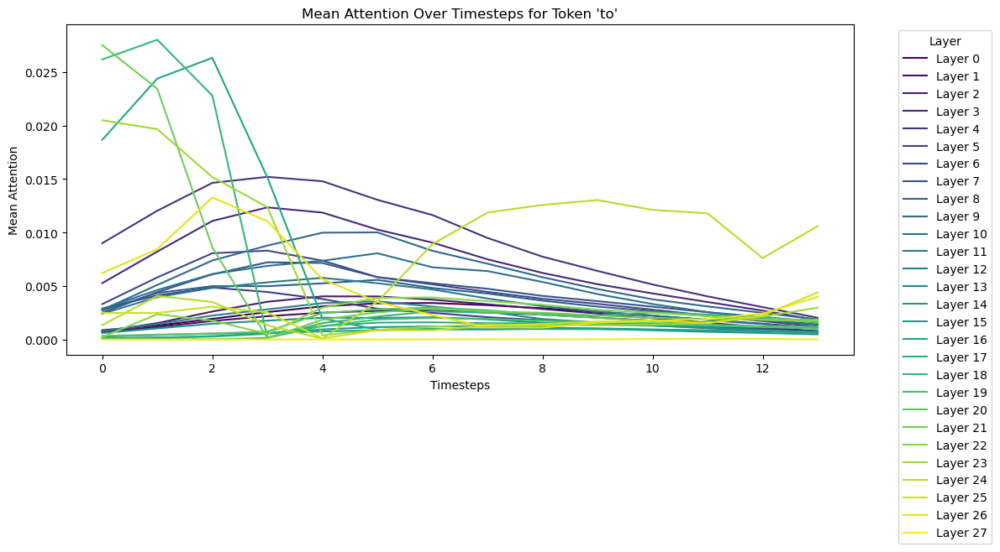

In [21]:
plot_mean_attention_across_timesteps(
    token_id=2,  # The token index within word_tokens
    num_layers=28,  # Adjust based on model architecture
    num_timesteps=14,  # Adjust based on available timesteps
    attnvis_store=attnvis_store,
    word_tokens=word_tokens
)


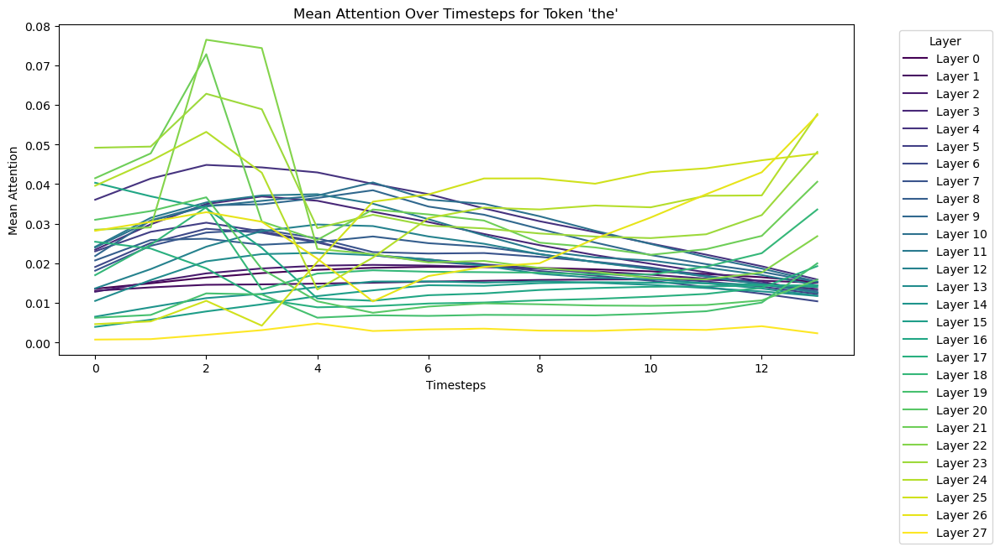

In [22]:
plot_mean_attention_across_timesteps(
    token_id=3,  # The token index within word_tokens
    num_layers=28,  # Adjust based on model architecture
    num_timesteps=14,  # Adjust based on available timesteps
    attnvis_store=attnvis_store,
    word_tokens=word_tokens
)


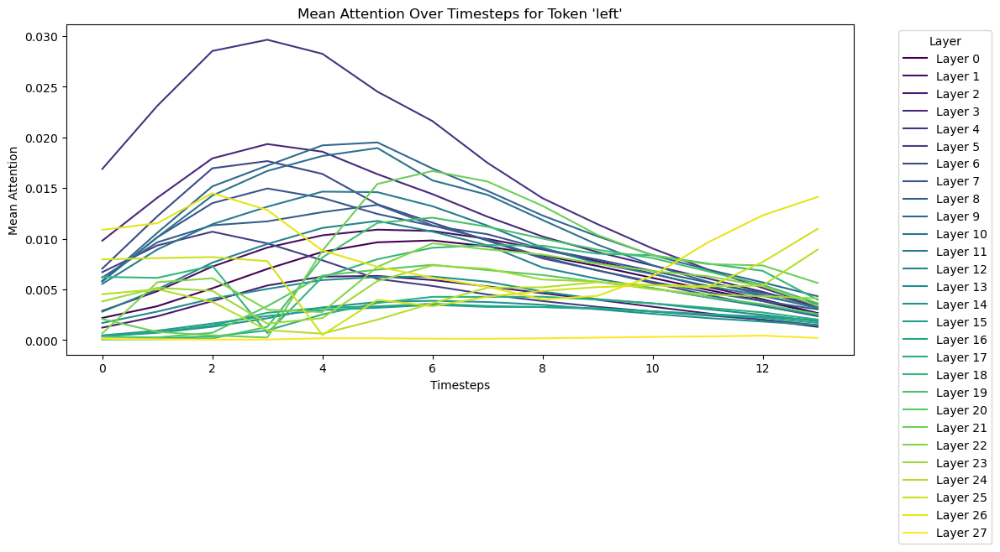

In [23]:
plot_mean_attention_across_timesteps(
    token_id=4,  # The token index within word_tokens
    num_layers=28,  # Adjust based on model architecture
    num_timesteps=14,  # Adjust based on available timesteps
    attnvis_store=attnvis_store,
    word_tokens=word_tokens
)


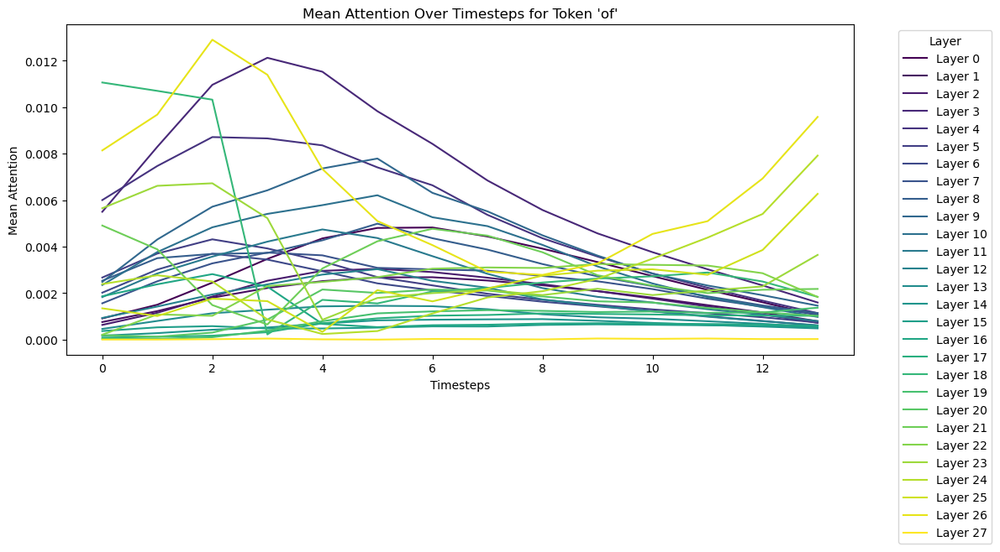

In [24]:
plot_mean_attention_across_timesteps(
    token_id=5,  # The token index within word_tokens
    num_layers=28,  # Adjust based on model architecture
    num_timesteps=14,  # Adjust based on available timesteps
    attnvis_store=attnvis_store,
    word_tokens=word_tokens
)


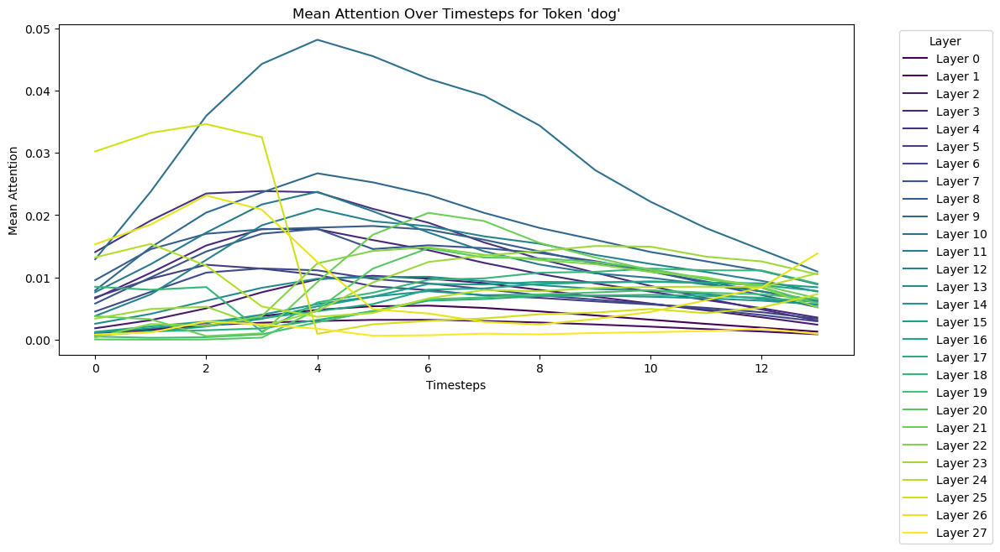

In [25]:
plot_mean_attention_across_timesteps(
    token_id=6,  # The token index within word_tokens
    num_layers=28,  # Adjust based on model architecture
    num_timesteps=14,  # Adjust based on available timesteps
    attnvis_store=attnvis_store,
    word_tokens=word_tokens
)


In [37]:

def plot_attention_heads(layer_i, timestep, validation_prompts, prompt_index, attnvis_store):
    """
    Plots the cross-attention maps for all heads at a given layer and timestep.
    
    Args:
        layer_i (int): The layer index to visualize.
        timestep (int): The timestep to visualize.
        validation_prompts (list): List of validation prompts.
        prompt_index (int): Index of the prompt to use from validation_prompts.
        attnvis_store: Object storing activation maps.
        embed_infos: Embedding information containing the token mask.
    """
    # Define your sentence as tokens
    sentence = validation_prompts[prompt_index]
    word_tokens = sentence.split()  # Tokenizing sentence into words

    #prompt_token_mask = embed_infos[0]['emb_mask'].cpu().squeeze(0).bool()
    sample_id = 0

    # Retrieve self and cross attention maps
    self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
    cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]

    # Create figure
    plt.figure(figsize=(12, 12))

    for head_id in range(16): 
        plt.subplot(4, 4, head_id + 1)
        attn_matrix = cross_attn_map[1 + sample_id, head_id, :, 0:len(word_tokens)].float().cpu().numpy()
        
        plt.imshow(attn_matrix, aspect='auto', cmap='viridis')
        plt.colorbar()
        
        # Set x-axis ticks with words
        plt.xticks(ticks=range(len(word_tokens)), labels=word_tokens, rotation=45, ha='right')
        
        plt.title(f'Head {head_id}')

    plt.tight_layout()
    plt.show()


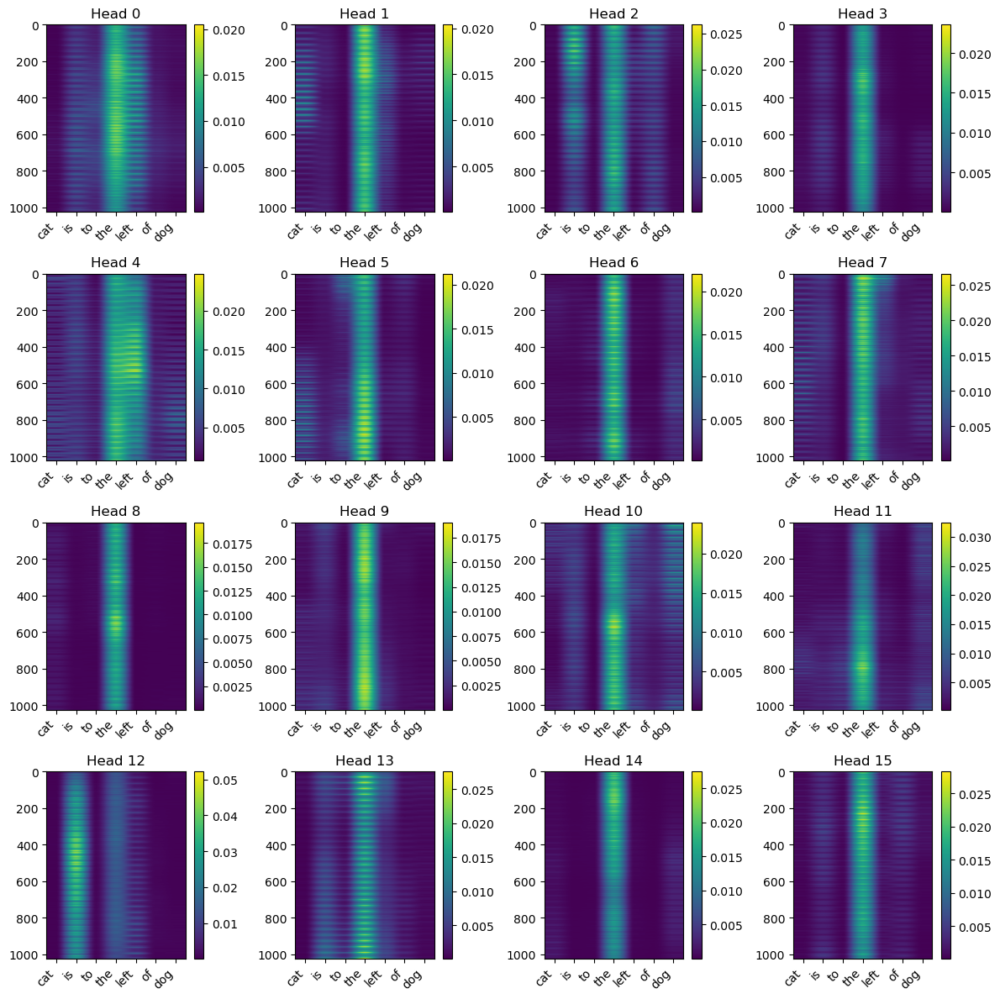

In [38]:
plot_attention_heads(layer_i=0, 
                     timestep=1, 
                     validation_prompts=validation_prompts, 
                     prompt_index=4, 
                     attnvis_store=attnvis_store)


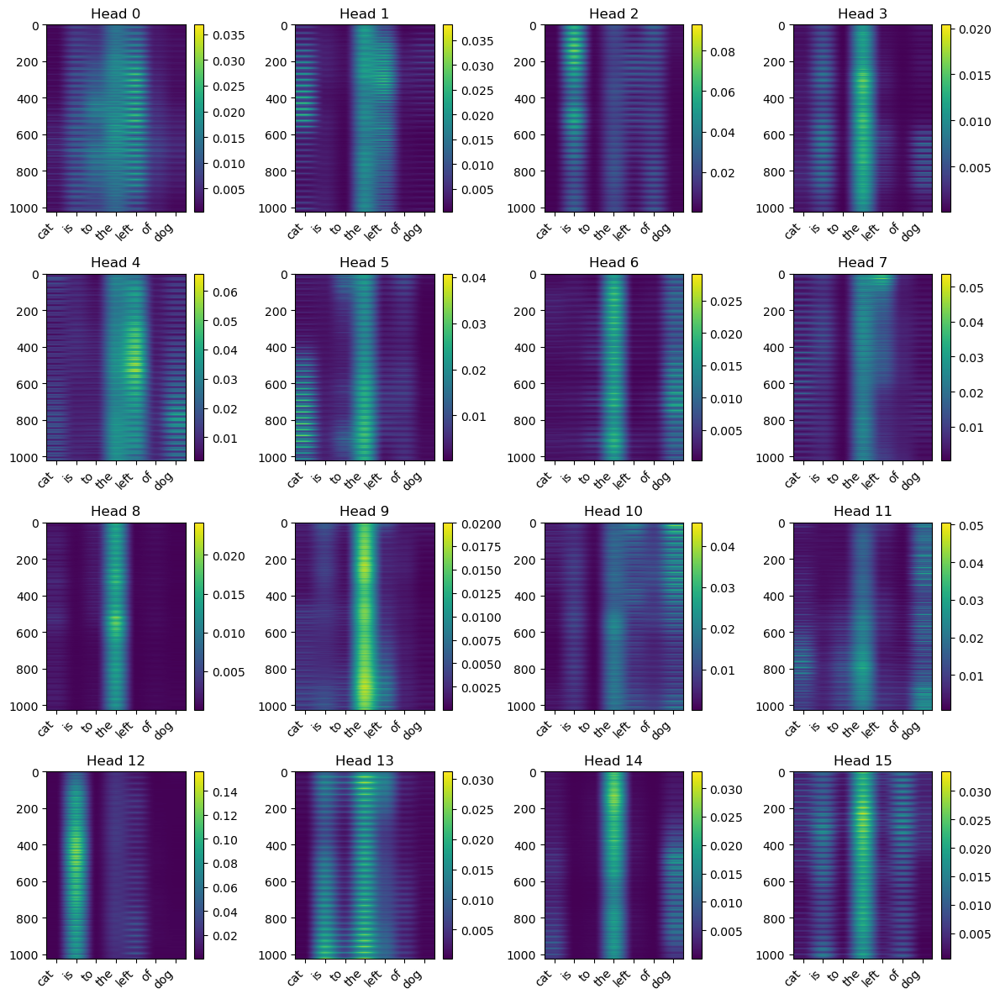

In [39]:
plot_attention_heads(layer_i=0, 
                     timestep=7, 
                     validation_prompts=validation_prompts, 
                     prompt_index=4, 
                     attnvis_store=attnvis_store)


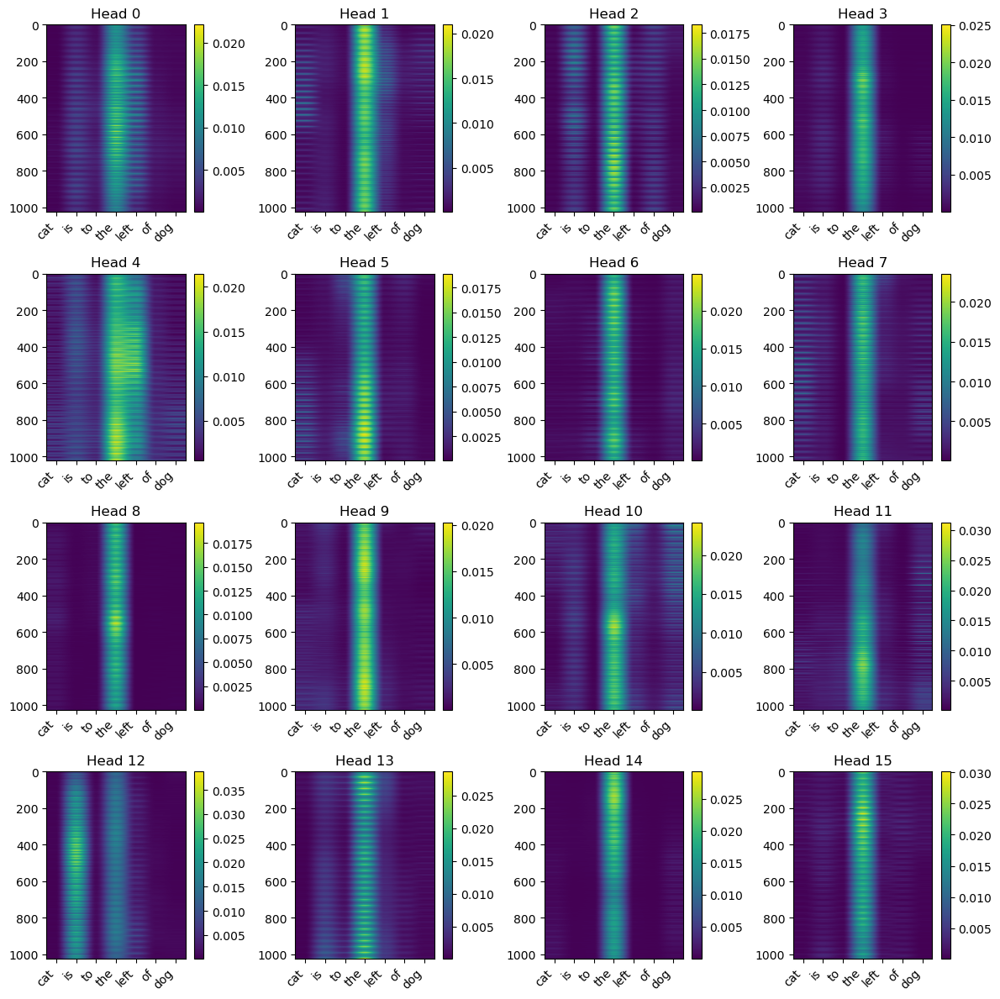

In [40]:
plot_attention_heads(layer_i=0, 
                     timestep=13, 
                     validation_prompts=validation_prompts, 
                     prompt_index=4, 
                     attnvis_store=attnvis_store)


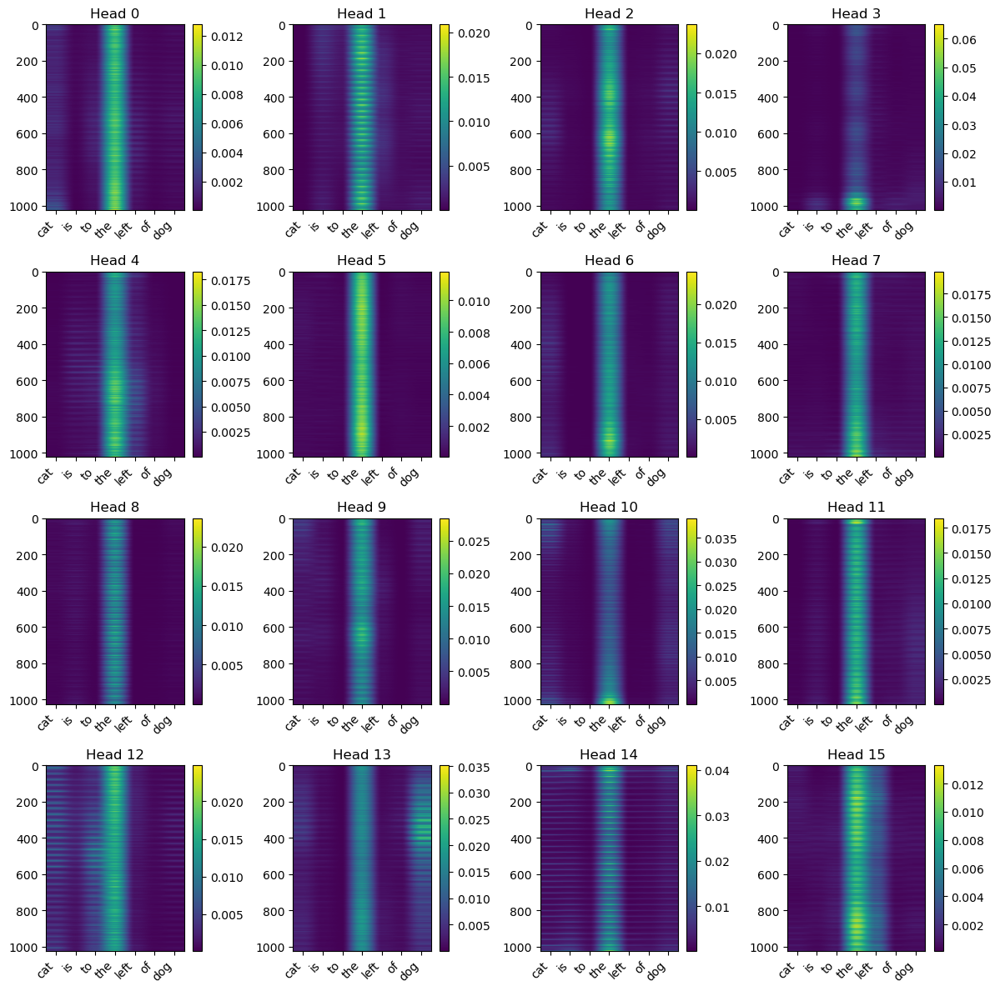

In [41]:
plot_attention_heads(layer_i=2, 
                     timestep=0, 
                     validation_prompts=validation_prompts, 
                     prompt_index=4, 
                     attnvis_store=attnvis_store)


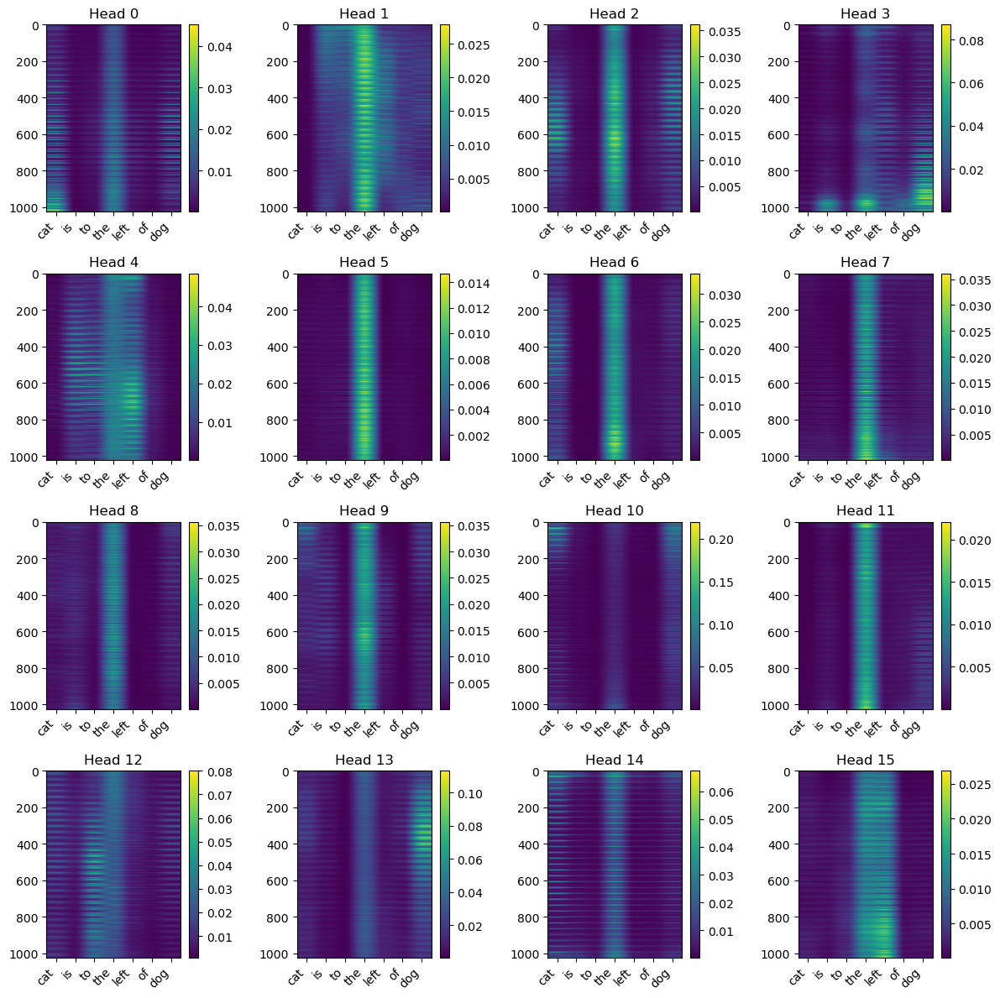

In [42]:
plot_attention_heads(layer_i=2, 
                     timestep=7, 
                     validation_prompts=validation_prompts, 
                     prompt_index=4, 
                     attnvis_store=attnvis_store)


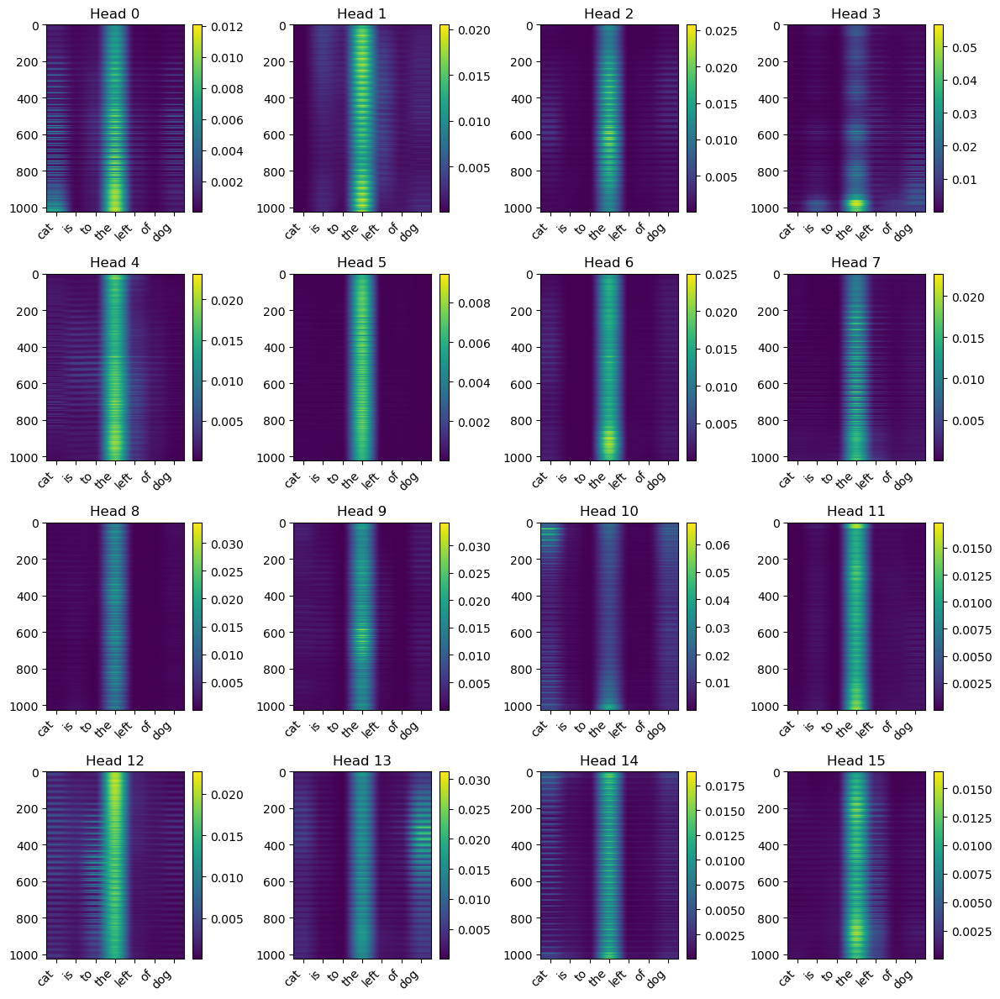

In [43]:
plot_attention_heads(layer_i=2, 
                     timestep=13, 
                     validation_prompts=validation_prompts, 
                     prompt_index=4, 
                     attnvis_store=attnvis_store)


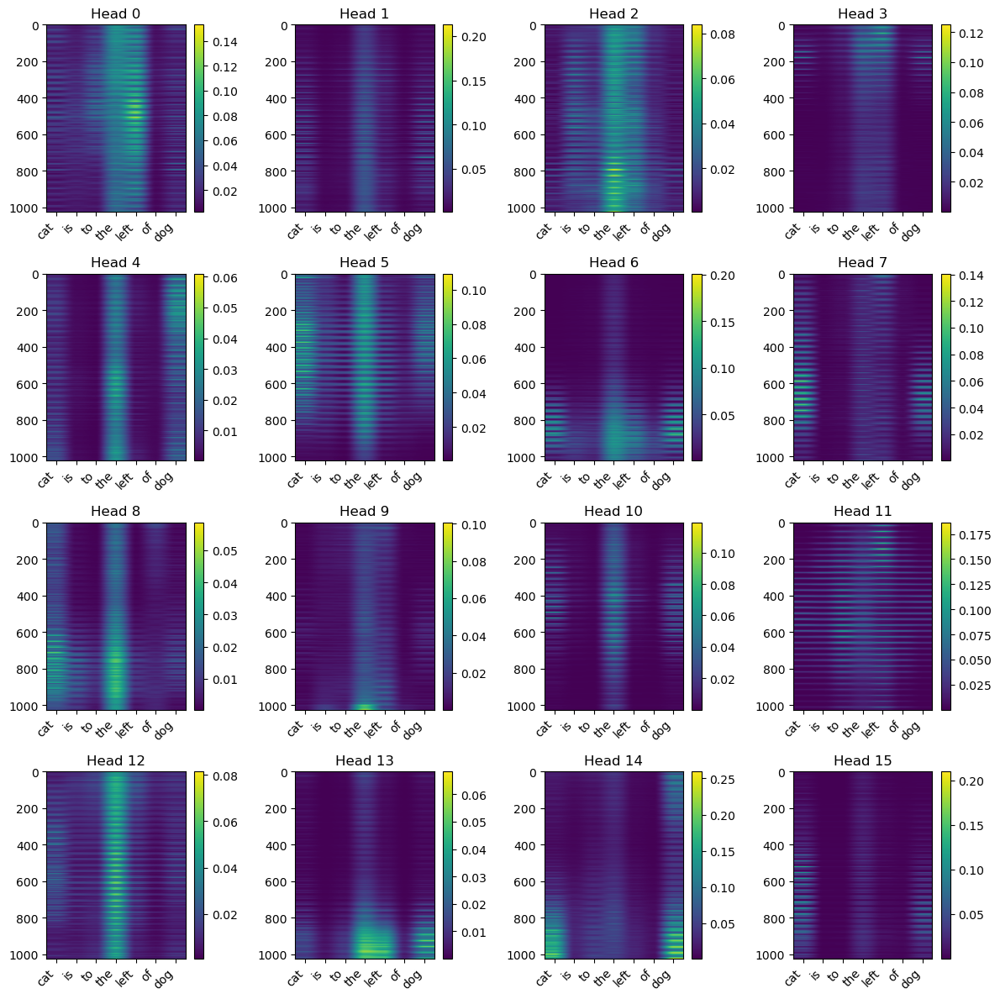

In [44]:
plot_attention_heads(layer_i=4, 
                     timestep=7, 
                     validation_prompts=validation_prompts, 
                     prompt_index=4, 
                     attnvis_store=attnvis_store)


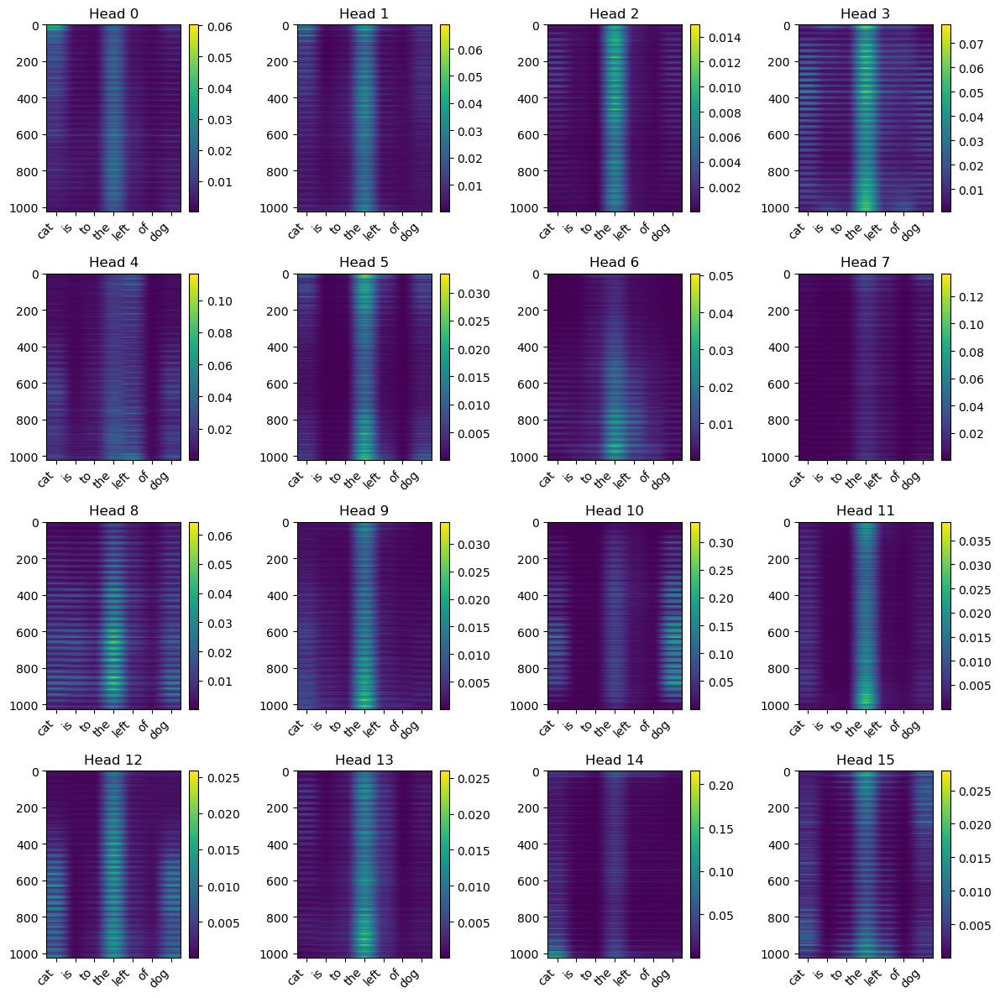

In [46]:
plot_attention_heads(layer_i=8, 
                     timestep=0, 
                     validation_prompts=validation_prompts, 
                     prompt_index=4, 
                     attnvis_store=attnvis_store)


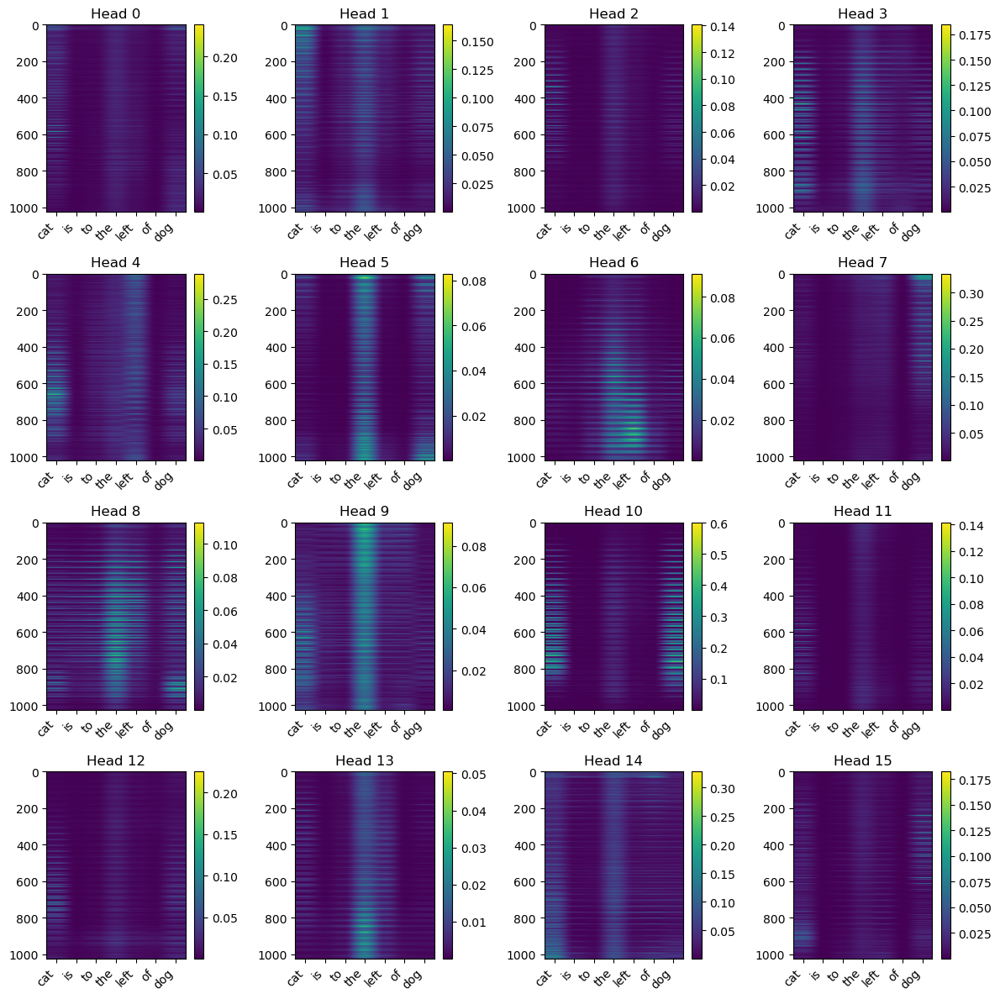

In [45]:
plot_attention_heads(layer_i=8, 
                     timestep=5, 
                     validation_prompts=validation_prompts, 
                     prompt_index=4, 
                     attnvis_store=attnvis_store)


### Batch analysis functions

#### Get object and position token indices

In [6]:
import spacy

# Load the spaCy English model (make sure to install it via "python -m spacy download en_core_web_sm")
nlp = spacy.load("en_core_web_sm")

def get_meaningful_token_indices(prompt: str):
    # Define a set of spatial keywords (expandable based on your use-case)
    spatial_keywords = {"left", "right", "above", "below", "behind", "front", "center", "top", "bottom"}
    
    doc = nlp(prompt)
    
    # Collect indices for noun tokens (which we use as our object entities)
    noun_indices = [token.i for token in doc if token.pos_ in {"NOUN", "PROPN"}]
    
    # Find the first token whose lowercase text is in our spatial keywords list
    spatial_index = None
    for token in doc:
        if token.text.lower() in spatial_keywords:
            spatial_index = token.i
            break
    
    # Check that we have at least two objects and one spatial relation token
    if noun_indices and spatial_index is not None and len(noun_indices) >= 2:
        return {"object1": noun_indices[0], "spatial": spatial_index, "object2": noun_indices[-1]}
    else:
        raise ValueError("Prompt parsing failed. Ensure the prompt contains two object entities and one spatial relationship.")



In [7]:

prompt = "cat is to the left of dog"
indices = get_meaningful_token_indices(prompt)
print(indices)
# Expected output: {'object1': 0, 'spatial': 4, 'object2': 6}

{'object1': 0, 'spatial': 4, 'object2': 6}


#### Get object masks

Note: measure where object is in the image -> pretrained segmentation model: https://github.com/facebookresearch/sam2

In [5]:
# Define a simple manipulation function
def ablate_embedding(embedding):
    #return embedding + constant
    return 0


def manipulate_token_and_generate(prompt, token_idx=None, manipulation_fn=None, pipe=None, seed=1, device=None):
    """
    Manipulates specific tokens' embeddings in a text prompt (if specified) and generates an image using a PixArt pipeline.
    
    Args:
        prompt (str): The text prompt for image generation.
        token_idx (list[int] or None, optional): A list of token indices in the prompt to manipulate. 
                                                 If None or empty, the function will generate an image without manipulation.
        manipulation_fn (callable or None, optional): A function that takes an embedding and modifies it.
                                                      If None, the function will use the unmodified text embedding.
        pipe: The PixArtAlphaPipeline instance.
        seed (int, optional): Random seed for reproducibility.
        device (str, optional): Device to use ('cuda' or 'cpu'). If None, it auto-detects.
    
    Returns:
        PIL.Image.Image: The generated image (with or without manipulated embeddings).
    """
    
    # Determine the device
    device = device or ("cuda" if torch.cuda.is_available() else "cpu")
    pipe.to(device)
    
    # Set the random seed for reproducibility
    if seed is not None:
        torch.manual_seed(seed)
        generator = torch.Generator(device).manual_seed(seed)
    else:
        generator = None  # Use default randomness if seed is not provided
    
    # Tokenize the prompt
    inputs = pipe.tokenizer(prompt, return_tensors="pt", padding="max_length", max_length=pipe.tokenizer.model_max_length).to(device)
    input_ids = inputs["input_ids"]
    attention_mask = inputs["attention_mask"]
    
    # Get text embeddings
    text_embeddings = pipe.text_encoder(input_ids=input_ids, attention_mask=attention_mask).last_hidden_state
    
    # Decode tokens for reference
    decoded_tokens = pipe.tokenizer.convert_ids_to_tokens(input_ids[0])
    print(f"Decoded Tokens: {decoded_tokens}")
    
    # If token_idx is provided and non-empty, manipulate the embeddings
    if token_idx and manipulation_fn:
        manipulated_embeddings = text_embeddings.clone()
        for idx in token_idx:
            manipulated_embeddings[0, idx, :] = manipulation_fn(manipulated_embeddings[0, idx, :])
    else:
        # Use unmanipulated embeddings
        manipulated_embeddings = text_embeddings

    # Pass embeddings into the pipeline
    generated_image = pipe(
        prompt_embeds=manipulated_embeddings, 
        prompt_attention_mask=attention_mask, 
        generator=generator,  # Pass the generator with fixed seed
        num_inference_steps=14,
        num_images_per_prompt=1,
        guidance_scale=4.5,
    ).images[0]
    
    return generated_image


Decoded Tokens: ['▁cat', '▁is', '▁to', '▁the', '▁left', '▁of', '▁dog', '</s>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<p

  0%|          | 0/14 [00:00<?, ?it/s]

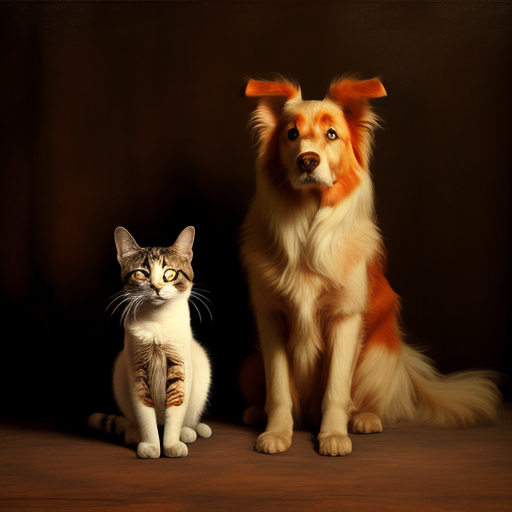

In [8]:
# original image
image_0 = manipulate_token_and_generate(prompt, None, lambda embedding: ablate_embedding(embedding), pipeline, seed=1, device=None)
image_0

In [9]:
# Save the image
image_path = "example_images/cat_left_dog.png"
image_0.save(image_path)
print("Image saved to:", image_path)

Image saved to: example_images/cat_left_dog.png


In [1]:
# TODO: fix which segmentation model to use

import torch
import torchvision
from torchvision import transforms as T
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

def segment_objects(image: Image.Image, confidence_threshold: float = 0.7):
    """
    Use Mask R-CNN (pre-trained on COCO) to segment objects in the image.
    
    Parameters:
      image: PIL.Image.Image
          The generated image.
      confidence_threshold: float
          Minimum score to consider a detection valid.
    
    Returns:
      dict: A dictionary mapping detected object classes to their masks.
            For instance, {'cat': [mask1, mask2], 'dog': [mask3]}.
    """
    # Load a pre-trained Mask R-CNN model.
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)
    model.eval()
    
    # Define transformation.
    transform = T.Compose([T.ToTensor()])
    img_tensor = transform(image)
    
    # Forward pass through the model.
    with torch.no_grad():
        predictions = model([img_tensor])[0]
    
    # COCO dataset class names (simplified, only relevant ones)
    coco_names = {17: "cat", 18: "dog"}  # Example: adjust or extend as needed.
    
    object_masks = {}
    for i, label in enumerate(predictions["labels"].tolist()):
        score = predictions["scores"][i].item()
        if score < confidence_threshold:
            continue
        if label in coco_names:
            # Extract mask; masks are given as [1, H, W] float tensors.
            mask = predictions["masks"][i, 0].mul(255).byte().cpu().numpy()
            # Binarize mask.
            mask = (mask > 127).astype(np.uint8)
            key = coco_names[label]
            object_masks.setdefault(key, []).append(mask)
    
    return object_masks



/n/home03/fjxdaisy/.conda/envs/torch2/lib/python3.10/site-packages/transformers/utils/hub.py:127: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(


In [ ]:
image_path = "example_images/cat_left_dog.png"
image_0 = Image.open(image_path)
masks = segment_objects(image_0)


Found 1 mask(s) for cat


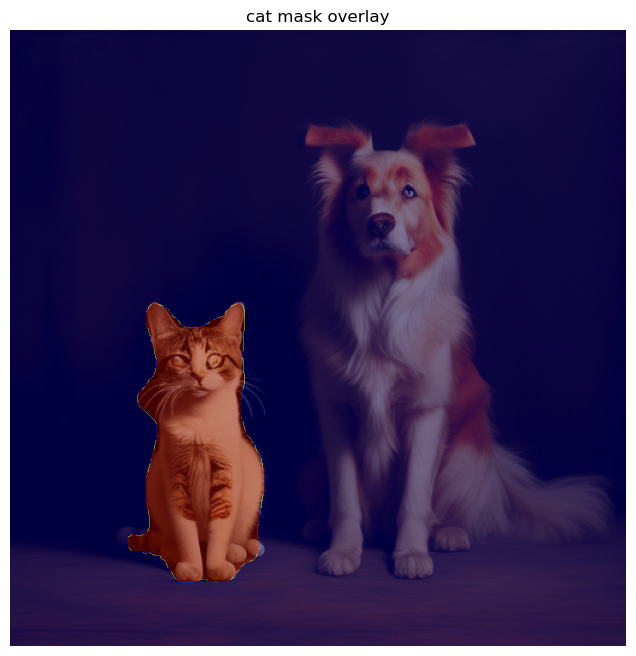

Found 1 mask(s) for dog


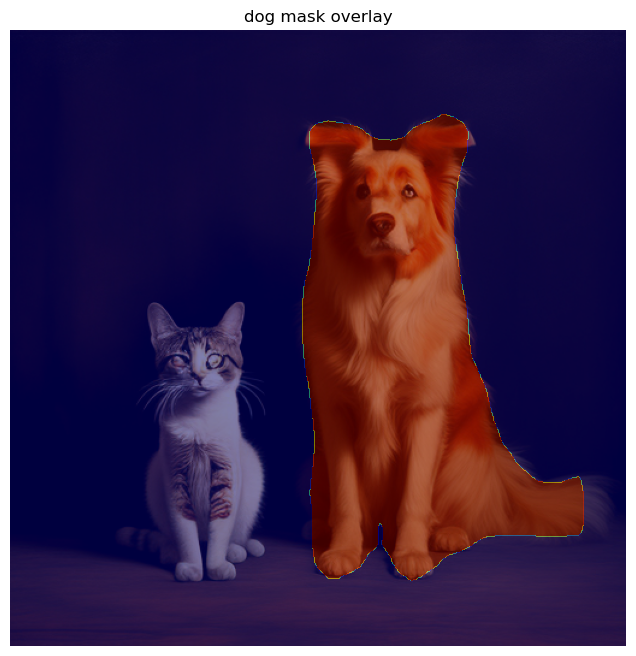

In [3]:
# overlay the mask on the image
for obj, mask_list in masks.items():
    print(f"Found {len(mask_list)} mask(s) for {obj}")
    mask = mask_list[0]  # Use the first mask for demonstration

    # Convert the original image to a numpy array
    image_np = np.array(image_0)

    # Create a figure and axis
    plt.figure(figsize=(8, 8))
    plt.imshow(image_np)
    # Overlay the mask: use a colormap (e.g., "jet") and set transparency with alpha
    plt.imshow(mask, cmap="jet", alpha=0.5)
    plt.title(f"{obj} mask overlay")
    plt.axis("off")
    plt.show()

#### Compute metrics

In [6]:
import numpy as np
import cv2
import scipy.stats
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import mutual_info_score
from skimage.metrics import structural_similarity as ssim

def compute_iou(mask1: np.ndarray, mask2: np.ndarray) -> float:
    """
    Compute the Intersection over Union (IoU) between two binary masks.
    """
    intersection = np.logical_and(mask1, mask2).sum()
    union = np.logical_or(mask1, mask2).sum()
    return intersection / union if union != 0 else 0.0

def compute_dice(mask1: np.ndarray, mask2: np.ndarray) -> float:
    """
    Compute the Dice coefficient (F1 score) between two binary masks.
    """
    intersection = np.logical_and(mask1, mask2).sum()
    sum_masks = mask1.sum() + mask2.sum()
    return 2 * intersection / sum_masks if sum_masks > 0 else 0.0

def compute_pearson(att_map: np.ndarray, seg_mask: np.ndarray) -> float:
    """
    Compute the Pearson correlation coefficient between two maps.
    Typically, the attention map is continuous while seg_mask may be binary.
    """
    return scipy.stats.pearsonr(att_map.flatten(), seg_mask.flatten())[0]

def compute_spearman(att_map: np.ndarray, seg_mask: np.ndarray) -> float:
    """
    Compute the Spearman rank correlation coefficient between two maps.
    """
    return scipy.stats.spearmanr(att_map.flatten(), seg_mask.flatten())[0]

def compute_cosine_similarity(att_map: np.ndarray, seg_mask: np.ndarray) -> float:
    """
    Compute the cosine similarity between the flattened versions of two maps.
    """
    att_vector = att_map.flatten().reshape(1, -1)
    seg_vector = seg_mask.flatten().reshape(1, -1)
    return cosine_similarity(att_vector, seg_vector)[0, 0]

def compute_centroid(mask: np.ndarray):
    """
    Compute the centroid (center of mass) of a binary mask.
    Returns a tuple (row, col) or None if mask is empty.
    """
    indices = np.argwhere(mask)
    if indices.size == 0:
        return None
    return indices.mean(axis=0)

def compute_centroid_distance(mask1: np.ndarray, mask2: np.ndarray) -> float:
    """
    Compute the Euclidean distance between the centroids of two binary masks.
    """
    centroid1 = compute_centroid(mask1)
    centroid2 = compute_centroid(mask2)
    if centroid1 is None or centroid2 is None:
        return np.nan
    return np.linalg.norm(centroid1 - centroid2)

def compute_mutual_information(mask1: np.ndarray, mask2: np.ndarray) -> float:
    """
    Compute the mutual information between two binary masks.
    This treats the flattened arrays as discrete variables.
    """
    flat1 = mask1.flatten()
    flat2 = mask2.flatten()
    return mutual_info_score(flat1, flat2)

def compute_ssim_metric(att_map: np.ndarray, seg_mask: np.ndarray) -> float:
    """
    Compute the Structural Similarity Index (SSIM) between two maps.
    Both maps are normalized to the [0, 1] range before computation.
    """
    att_norm = (att_map - att_map.min()) / (att_map.max() - att_map.min() + 1e-8)
    seg_norm = (seg_mask - seg_mask.min()) / (seg_mask.max() - seg_mask.min() + 1e-8)
    ssim_value, _ = ssim(att_norm, seg_norm, full=True)
    return ssim_value




In [ ]:

# For demonstration, create a dummy continuous attention map
# and a binary segmentation mask for an object.
np.random.seed(42)
# Let's assume we have a 32x32 attention map (e.g., from one head at a given timestep)
attention_map = np.random.rand(32, 32)

# And assume our segmentation model gives us a binary mask for the object.
segmentation_mask = np.zeros((32, 32), dtype=np.uint8)
segmentation_mask[10:20, 10:20] = 1  # A square region representing the object

# For some metrics (IoU, Dice, centroid distance, mutual information), we need binary masks.
# Here we threshold the attention map to create a binary version.
threshold = 0.5
att_binary = (attention_map > threshold).astype(np.uint8)

# Compute and print metrics comparing the attention map with the segmentation mask.
print("IoU:", compute_iou(att_binary, segmentation_mask))
print("Dice Coefficient:", compute_dice(att_binary, segmentation_mask))
print("Pearson Correlation:", compute_pearson(attention_map, segmentation_mask))
print("Spearman Correlation:", compute_spearman(attention_map, segmentation_mask))
print("Cosine Similarity:", compute_cosine_similarity(attention_map, segmentation_mask))
print("Centroid Distance:", compute_centroid_distance(att_binary, segmentation_mask))
print("Mutual Information:", compute_mutual_information(att_binary, segmentation_mask))
print("SSIM:", compute_ssim_metric(attention_map, segmentation_mask))